In [ ]:
!pip install tensorflow==2.15

In [ ]:
import tensorflow as tf

In [ ]:
tf.__version__

'2.15.0'

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!kaggle datasets download -d jessicali9530/stanford-dogs-dataset

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset
License(s): other
100% 748M/750M [00:27<00:00, 30.8MB/s]
100% 750M/750M [00:27<00:00, 28.6MB/s]


In [ ]:
!unzip '/content/stanford-dogs-dataset.zip'

Streaming output truncated to the last 5000 lines.
  inflating: images/Images/n02108089-boxer/n02108089_11687.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_117.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_11807.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_11875.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_122.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_12232.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_125.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_12738.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_12739.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_12827.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_13340.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_13526.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_1353.jpg  
  inflating: images/Images/n02108089-boxer/n02108089_1355.jpg  
  inflating: images/Images/n02108089-boxer/n021

In [ ]:
!pip install flask-ngrok

In [ ]:
# Display the Folders/Classes

import numpy as np
import pandas as pd
import os
from shutil import copyfile


print(os.listdir('/content/images/Images'))
dog_classes = os.listdir('/content/images/Images')

In [ ]:
# Get the dog labels

breeds = [breed.split('-',1)[1] for breed in dog_classes] # get labels by splitting the folder name at dash
breeds[:10] # view some of the labels

In [ ]:
# Get images full path and their labels

from itertools import chain

X = []
y = []

fullpaths = ['/content/images/Images/{}'.format(dog_class) for dog_class in dog_classes]

for counter, fullpath in enumerate(fullpaths):
    for imgname in os.listdir(fullpath):
        X.append([fullpath + '/' + imgname])
        y.append(breeds[counter])

X = list(chain.from_iterable(X)) # unnest the lists and join together into one list

len(X) # number of pictures

In [ ]:
# Random shuffle the images for learning

import random

# shuffle X and y
combined = list(zip(X, y))
random.shuffle(combined)

X[:], y[:] = zip(*combined)

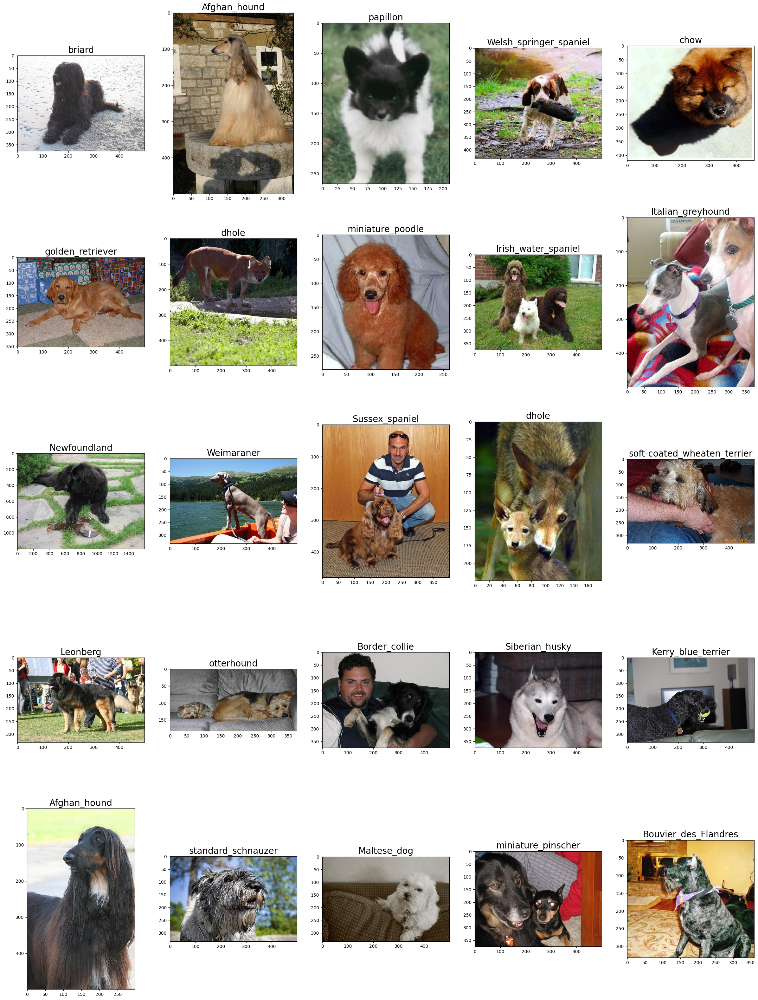

In [ ]:
# Display random dogs pictures

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.image import imread

plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(X)), 25)): # random 25 images
    plt.subplot(5, 5, counter+1)
    plt.subplots_adjust(hspace=0.1)
    filename = X[i]
    image = imread(filename)
    plt.imshow(image)
    plt.title(y[i], fontsize=20)


plt.show()

In [ ]:
# Choose a subset to test code

X = X[:4000]
y = y[:4000]

In [ ]:
# Convert labels to one-hot encoded labels

from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Label and one-hot encoding y labels
le = LabelEncoder()
le.fit(y)
y_ohe = to_categorical(le.transform(y), len(breeds))
y_ohe = np.array(y_ohe)

In [ ]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img
import numpy as np

# Function to load and resize images
def load_images(image_paths, target_size=(220, 220)):  # Reduced target size
    return np.array([img_to_array(load_img(img, target_size=target_size)) for img in image_paths])

# Load and preprocess images with reduced resolution
img_data = load_images(X, target_size=(220, 220))

# Use a smaller subset of the data
subset_size = 0.9  # Use 75% of the data
X_subset, _, y_subset, _ = train_test_split(img_data, y_ohe, test_size=(1 - subset_size), stratify=np.array(y), random_state=2)

# Split the subset data into training, validation, and test sets
x_train, x_test, y_train, y_test = train_test_split(X_subset, y_subset, test_size=0.2, stratify=np.array(y_subset), random_state=2)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, stratify=np.array(y_train), random_state=2)

print('Training Dataset Size: ', x_train.shape)
print('Validation Dataset Size: ', x_val.shape)
print('Testing Dataset Size: ', x_test.shape)
print('Training Label Size: ', y_train.shape)
print('Validation Label Size: ', y_val.shape)
print('Testing Label Size: ', y_test.shape)

# Clear some space from memory
import gc
del img_data, X_subset, y_subset
gc.collect()

Training Dataset Size:  (2304, 220, 220, 3)
Validation Dataset Size:  (576, 220, 220, 3)
Testing Dataset Size:  (720, 220, 220, 3)
Training Label Size:  (2304, 120)
Validation Label Size:  (576, 120)
Testing Label Size:  (720, 120)


79459

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Function to load and resize images
def load_images(image_paths, target_size=(220, 220)):
    return np.array([img_to_array(load_img(img, target_size=target_size)) for img in image_paths])

# Load and preprocess images with reduced resolution
img_data = load_images(X, target_size=(220, 220))

# Use a smaller subset of the data
subset_size = 0.9
X_subset, _, y_subset, _ = train_test_split(img_data, y_ohe, test_size=(1 - subset_size), stratify=np.array(y), random_state=2)

# Split the subset data into training, validation, and test sets
x_train, x_test, y_train, y_test = train_test_split(X_subset, y_subset, test_size=0.2, stratify=np.array(y_subset), random_state=2)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, stratify=np.array(y_train), random_state=2)

# Flatten the images for Decision Tree
x_train_flat = x_train.reshape(x_train.shape[0], -1)
x_val_flat = x_val.reshape(x_val.shape[0], -1)
x_test_flat = x_test.reshape(x_test.shape[0], -1)

# Initialize and train Decision Tree classifier
dt = DecisionTreeClassifier(random_state=2)
dt.fit(x_train_flat, y_train)

# Evaluate Decision Tree classifier
print('Training accuracy:', dt.score(x_train_flat, y_train))
print('Validation accuracy:', dt.score(x_val_flat, y_val))
print('Testing accuracy:', dt.score(x_test_flat, y_test))


In [ ]:
# Data Augmentation

from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator

batch_size = 32

# Create train generator
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, # only use rescale=1./255 if training from scratch
                                  rotation_range = 30,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  horizontal_flip = True) # CHECK

train_generator = train_datagen.flow(x_train, y_train,
                                     shuffle = False, batch_size = batch_size, seed = 1)

# Create validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input) # do not augment validation data

val_generator = val_datagen.flow(x_val, y_val,
                                shuffle = False, batch_size = batch_size, seed = 1)

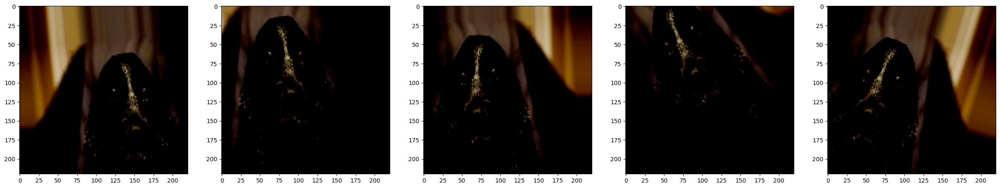

In [ ]:
img_id = 16

dog_generator = train_datagen.flow(x_train[img_id:img_id+1], y_train[img_id:img_id+1],
                                     shuffle = False, batch_size = batch_size, seed = 1)

plt.figure(figsize=(30,20))
dogs = [next(dog_generator) for i in range(0,5)]
for counter, dog in enumerate(dogs):
    plt.subplot(1, 5, counter+1)
    plt.imshow(dog[0][0])
    #plt.axis('off')

plt.show()

In [ ]:
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.utils import plot_model

# Load InceptionV3 pre-trained model with adjusted input shape
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(220, 220, 3))  # Adjusted input shape

model = models.Sequential()
model.add(base_model)  # Add pre-trained layers
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.3))
model.add(Dense(512, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(len(breeds), activation='softmax'))

# Freeze pre-trained layers
print('Number of trainable weights before freezing the base layer:', len(model.trainable_weights))
model.layers[0].trainable = False
print('Number of trainable weights after freezing the base layer:', len(model.trainable_weights))

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
model.summary()




In [ ]:
model.compile(Adam(lr=.0001), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

In [ ]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Train Model

train_steps_per_epoch = x_train.shape[0] // batch_size
val_steps_per_epoch = x_val.shape[0] // batch_size
epochs = 20

history = model.fit_generator(train_generator,
                             steps_per_epoch = train_steps_per_epoch,
                             validation_data = val_generator,
                             validation_steps = val_steps_per_epoch,
                             epochs = epochs, verbose = 1)

In [ ]:
# Plot Accuracy and Loss

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Transfer Learning Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1,epochs+1))
ax1.plot(epoch_list, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(np.arange(0, epochs+1, 5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

In [ ]:
# Evaluate Model on Test Data

x_test1 = x_test / 255. # rescale to 0-1. Divide by 255 as its the max RGB value
test_predictions = model.predict(x_test1)

# get model predictions
predictions = le.classes_[np.argmax(test_predictions,axis=1)] # get labels and reverse back to get the text labels
# get target labels
target_labels = le.classes_[np.argmax(y_test,axis=1)]

# Store in dataframe
predict_df = pd.DataFrame({'Target_Labels': target_labels, 'Predictions': predictions})
predict_df.head(20)

23/23 [==============================] - 5s 163ms/step


,Target_Labels,Predictions
0,Australian_terrier,Australian_terrier
1,Siberian_husky,malamute
2,cocker_spaniel,English_setter
3,Brabancon_griffon,Brabancon_griffon
4,Airedale,Airedale
5,Cardigan,Appenzeller
6,collie,Border_collie
7,West_Highland_white_terrier,West_Highland_white_terrier
8,Rhodesian_ridgeback,redbone
9,kuvasz,kuvasz


In [ ]:
# Get accuracy of measure

correct = (target_labels == predictions)
accuracy = correct.sum() / correct.size
print(accuracy)

0.7722222222222223


In [ ]:
# Evaluate Model Performance

from model_evaluation_utils import get_metrics

get_metrics(true_labels=target_labels,
            predicted_labels=predictions)

Accuracy: 0.7722
Precision: 0.8046
Recall: 0.7722
F1 Score: 0.7667


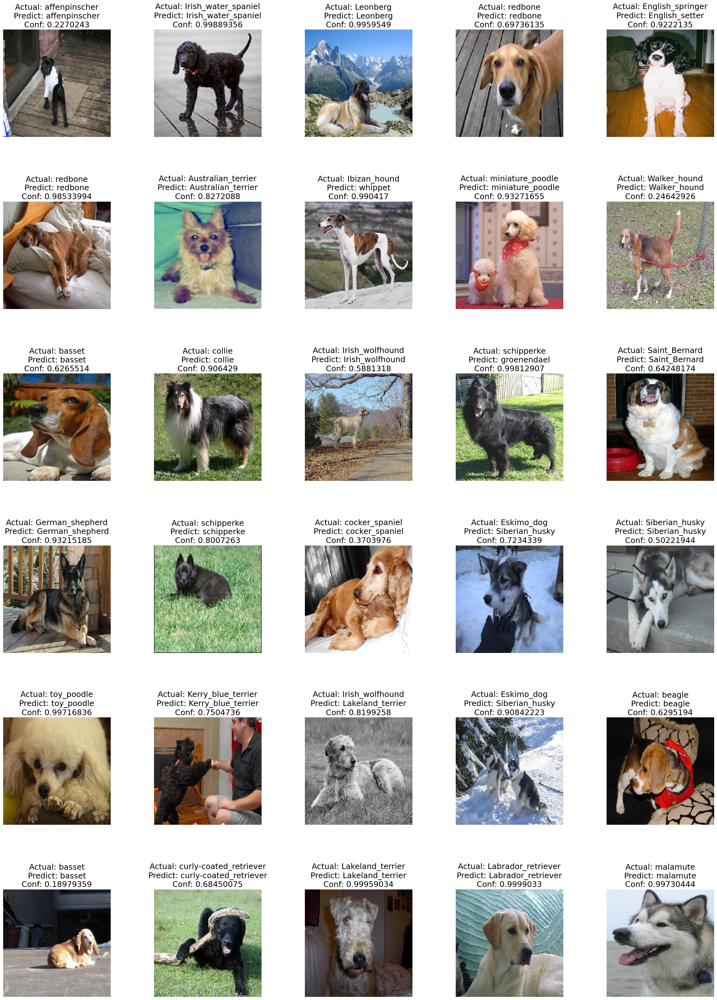

In [ ]:
# Plot Actual vs Predicted Images with Confidence Levels

plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)): # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(x_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredict: ' + predicted + '\nConf: ' + conf, fontsize=18)

plt.show()

In [ ]:
model.save('model.h5')

NameError: name 'model' is not defined